In [ ]:
from ecell4 import *
from ecell4.extra import ensemble
import numpy as np
import matplotlib.pylab as plt
%matplotlib inline

simrun=400#00#0
duration = 1000
nproc=300
L=cbrt(100)
Ca=5.
Cb=1.
k0= 0.1
method='sge'

def write(name,obs):
    f=open(name,'w')
    data = np.array(obs.data()).T
    np.savetxt(name,np.column_stack([data[0],data[1]]),delimiter=',',fmt='%s')
    f.close()        
    print('saving into',name)        
    e=open(name+'_err','w')        
    err = np.array(obs.error()).T        
    np.savetxt(name+'_err',np.column_stack([err[0],err[1]]),delimiter=',',fmt='%s')
    e.close()
    print('saving into',name+'_err')

def singlerun(rm,D,solver='ode',intrinsic=False,simrun=1):   
    print(solver)
    V = L**3 
    if solver=='spa':
        solver=("spatiocyte",rm*1.0208582)
        V=spatiocyte.SpatiocyteWorld.calculate_volume(Real3(L,L,L),rm*1.0208582)    
    elif solver=='G':
        solver = ("gillespie")
    keff = k0/Ca/Cb
    Nb=int(Cb*V)
    print('Nb',Nb)
    kd = 4*np.pi*rm*2*D*2
    ka = keff*kd/(kd-keff)
    assert(ka>0)
    with species_attributes():
        A | {'D': D, 'radius':rm*1.0208582  }
        B | {'D': D, 'radius':rm*1.0208582  }

    with reaction_rules():
        ~A > A | k0
        A + B >B | (ka if intrinsic else keff)
    m = get_model()
    print('rm={:.3},D={:.3}'.format(rm,D))
    print('kon={:.3},ka={:.3},kd={:.3},keff={:.3},kfactor={:.3},V={:.3}'.format(k0,ka,kd,keff,ka/kd,V))
    if simrun >1    :
        obs=ensemble.ensemble_simulations(duration,n=simrun, y0={'B':Nb},model=m, solver=solver,volume=ones()*L,species_list=["A"],return_type='observer',nproc=nproc,method=method,path='tmp')#,return_type="observer")
    else:
        obs=run_simulation(duration,model=m,y0={'B':Nb},return_type='observer',species_list=['A'],solver=solver,volume=ones()*L)
    data = np.array(obs.data()).T
    print('mean [A]',np.mean(data[1][50:])/V)   
    write('/home/chew/outputdata/sturrock_bd_{}_rm{:.3}_D{:.3}_L{:.3}b'.format('spa',rm,D,L),obs)
    return obs

#obs2=singlerun(0.05,0.1,'spa',True,simrun)   
#obs3=singlerun(0.05,0.01,'spa',True,simrun)   
#obs4=singlerun(0.1,0.01,'spa',True,simrun)   
#obs5=singlerun(0.1,0.1,'spa',True,simrun)   
#obs6=singlerun(0.1,0.005,'spa',True,simrun)   
#obs7=singlerun(0.02,0.1,'spa',True,simrun)   
#obs8=singlerun(0.02,0.02,'spa',True,simrun)   
#obs9=singlerun(0.05,0.02,'spa',True,simrun)   
#obs1=singlerun(0.05,0.1,'spa',True,simrun)   
#for job in [[0.005,0.1],[0.02,0.1]]:
for job in [[0.02,0.02],[0.05,0.01]]:#[0.05,0.1],[0.05,0.01]]:
    obs=singlerun(job[0],job[1],'spa',True,simrun)
    #obs=singlerun(job[0],job[1],'G',False,simrun)

    

/usr/local/lib/python3.5/dist-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/usr/local/lib/python3.5/dist-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


spa
Nb 103
rm=0.02,D=0.02
kon=0.1,ka=3.79,kd=0.0201,keff=0.02,kfactor=1.88e+02,V=1.03e+02


DEBUG:sge:Your job-array 945334.1-400:1 ("sge-_4yk2tc7.job") has been submitted
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 1-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 75
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 146
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 217
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 288
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 55
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 128
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 197
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 36
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 37
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 38
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 107
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 110
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 111
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 181
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 184
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 251
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 252
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 253
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 254
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 255
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 17
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 18
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 19
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 20
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 21
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 227
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 298
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 299
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 300
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 301-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t ch

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 66
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 67
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 68
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 69
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 70
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 137
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 138
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 140
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 142
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 143
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 208
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 209
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 210
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 211
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 212
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 213
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 214
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 280
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 281
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 282
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 284
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 285
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 47
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 48
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 49
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 50
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 122
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 123
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 96
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 97
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 101
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 167
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 171
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 11
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 83
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 147
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 148
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 149
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 150
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 151
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 152
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 154
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 218
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 219
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 220
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 221
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 222
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 223
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 224
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 225
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 289
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 290
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 291
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 294
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 295
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 296
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 59
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 62
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 63
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 132
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 134
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 135
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 202
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 203
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 204
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 205
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 206
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 207
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 273
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 275
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 276
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 277
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 279
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 39
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 40
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 41
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 42
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 43
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 44
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 45
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 46
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 114
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 115
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 116
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 118
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 119
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 186
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 190
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 191
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 258
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 260
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 261
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 262
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 263
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 264
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 26
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 29
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 31
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 99
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 100
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 102
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 103
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 104
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 105
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 106
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 173
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 174
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 175
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 176
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 178
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 179
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 244
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 245
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 246
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 247
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 248
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 249
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 250
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 9
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 12
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 13
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 14
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 15
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 16
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:3

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 83
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 84
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 164
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 165
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 235
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 236
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 237
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h1.q@ibc05                         1 306
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 307-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 2
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 3
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew  

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 72
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 73
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 153
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 154
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 155
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 160
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 230
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 232
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 235
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 236
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h1.q@ibc10                         1 305
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h1.q@ibc05                         1 306
DEBUG:sge: 945334 0.00000 sge-_4yk2t chew         qw    10/26/2017 15:38:34                                    1 307-400:1
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 2
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 77
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 78
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 80
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 81
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 83
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 156
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 157
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 158
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 159
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 161
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 162
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 163
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 164
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 236
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 237
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 238
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 239
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 240
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 241
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 242
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 243
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 1
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 2
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 3
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 4
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 5
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 6
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 7
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 8
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 87
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 88
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 92
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 94
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 95
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc22                         1 177
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 180
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 182
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 183
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 185
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 186
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 265
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 266
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 267
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 269
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 270
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 271
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 24
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 25
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 27
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 28
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 30
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 33
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 34
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 126
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 127
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 129
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 130
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc16                         1 131
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 228
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc25                         1 229
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc05                         1 231
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 233
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc24                         1 234
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc28                         1 235
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc23                         1 236
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 237
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 324
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc26                         1 325
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc04                         1 326
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         t     10/26/2017 16:23:24 h1.q@ibc04                         1 327
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc17                         1 328
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         t     10/26/2017 16:23:24 h1.q@ibc14                         1 329
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc23                         1 330
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc08                         1 331
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 79
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 82
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 83
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 90
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 91
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 192
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 193
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 194
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 195
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 198
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 199
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 200
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 201
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h1.q@ibc04                         1 307
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h2.q@ibc22                         1 308
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 309
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc26                         1 310
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 311
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc17                         1 312
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc14                         1 313
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc23                         1 314
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 51
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 52
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 54
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 56
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 57
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 58
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 60
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 61
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 168
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 169
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 172
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc14                         1 186
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 187
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc17                         1 188
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 189
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h2.q@ibc22                         1 308
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 309
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc26                         1 310
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 311
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc17                         1 312
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc14                         1 313
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc23                         1 314
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc08                         1 315
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc23                         1 379
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc02                         1 380
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc27                         1 381
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc21                         1 382
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 383
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc03                         1 384
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc20                         1 385
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc15                         1 386
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 108
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 109
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 112
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 114
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 117
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 267
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 293
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 359
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc07                         1 360
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc15                         1 361
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc20                         1 362
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc06                         1 363
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc26                         1 364
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc17                         1 365
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 366
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 63
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 64
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc13                         1 65
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 71
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc11                         1 76
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 83
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 85
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 259
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 267
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc02                         1 268
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 272
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc18                         1 274
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 278
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc08                         1 283
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 292
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 359
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc07                         1 360
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc15                         1 361
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc20                         1 362
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc06                         1 363
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc26                         1 364
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc17                         1 365
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 366
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 113
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc20                         1 114
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 120
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc19                         1 121
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc04                         1 135
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc15                         1 136
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc07                         1 139
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc08                         1 331
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc12                         1 332
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc13                         1 333
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc24                         1 334
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc10                         1 335
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc28                         1 336
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc19                         1 337
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc22                         1 338
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 10
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc12                         1 12
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 32
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 33
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 35
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc11                         1 320
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc05                         1 321
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 322
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc19                         1 323
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 324
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc26                         1 325
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc04                         1 326
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc04                         1 327
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 391
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 392
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 393
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 394
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 395
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 396
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h2.q@ibc28                         1 397
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h2.q@ibc19                         1 398
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc19                         1 323
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 324
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc26                         1 325
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc04                         1 326
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc04                         1 327
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc17                         1 328
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc14                         1 329
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc23                         1 330
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 394
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 395
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 396
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h2.q@ibc28                         1 397
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h2.q@ibc19                         1 398
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h2.q@ibc23                         1 399
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc05                         1 400
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state su

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc22                         1 338
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc11                         1 339
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc05                         1 340
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc16                         1 341
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc25                         1 342
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc26                         1 343
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc17                         1 344
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc02                         1 345
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 86
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc27                         1 89
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc26                         1 98
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc10                         1 133
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h2.q@ibc21                         1 141
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 145
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc06                         1 166
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 15:38:39 h1.q@ibc03                         1 170
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc15                         1 361
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc20                         1 362
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc06                         1 363
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc26                         1 364
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc17                         1 365
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 366
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 367
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 368
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc24                         1 317
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc28                         1 318
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc22                         1 319
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc11                         1 320
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc05                         1 321
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 322
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc19                         1 323
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 324
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc06                         1 388
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc26                         1 389
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc17                         1 390
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 391
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 392
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 393
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 394
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 395
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 347
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 348
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 349
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 350
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 351
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc14                         1 352
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc22                         1 353
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc18                         1 354
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h2.q@ibc22                         1 308
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 309
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc26                         1 310
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 311
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc17                         1 312
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc14                         1 313
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc23                         1 314
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc08                         1 315
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc23                         1 379
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc02                         1 380
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc27                         1 381
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc21                         1 382
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 383
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc03                         1 384
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc20                         1 385
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc15                         1 386
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc16                         1 341
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc25                         1 342
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc26                         1 343
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc17                         1 344
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc02                         1 345
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc27                         1 346
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 347
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 348
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h1.q@ibc10                         1 305
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h1.q@ibc05                         1 306
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h1.q@ibc04                         1 307
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h2.q@ibc22                         1 308
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 309
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc26                         1 310
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 311
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc17                         1 312
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc18                         1 376
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc25                         1 377
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc12                         1 378
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc23                         1 379
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc02                         1 380
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc27                         1 381
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc21                         1 382
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 383
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc16                         1 341
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc25                         1 342
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc26                         1 343
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc17                         1 344
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc02                         1 345
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc27                         1 346
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 347
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 348
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h1.q@ibc05                         1 306
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h1.q@ibc04                         1 307
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h2.q@ibc22                         1 308
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 309
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc26                         1 310
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 311
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc17                         1 312
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc14                         1 313
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc25                         1 377
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc12                         1 378
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc23                         1 379
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc02                         1 380
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc27                         1 381
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc21                         1 382
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 383
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc03                         1 384
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc25                         1 342
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc26                         1 343
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc17                         1 344
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc02                         1 345
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc27                         1 346
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 347
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 348
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 349
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h1.q@ibc04                         1 307
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h2.q@ibc22                         1 308
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 309
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc26                         1 310
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 311
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc17                         1 312
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc14                         1 313
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc23                         1 314
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc12                         1 378
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc23                         1 379
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc02                         1 380
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc27                         1 381
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc21                         1 382
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 383
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc03                         1 384
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc20                         1 385
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc26                         1 343
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc17                         1 344
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc02                         1 345
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc27                         1 346
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 347
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 348
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 349
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 350
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h2.q@ibc22                         1 308
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 309
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc26                         1 310
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 311
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc17                         1 312
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc14                         1 313
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc23                         1 314
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc08                         1 315
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc23                         1 379
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc02                         1 380
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc27                         1 381
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc21                         1 382
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 383
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc03                         1 384
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc20                         1 385
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc15                         1 386
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc17                         1 344
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc02                         1 345
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc27                         1 346
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 347
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 348
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 349
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 350
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 351
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc26                         1 310
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 311
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc17                         1 312
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc14                         1 313
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc23                         1 314
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc08                         1 315
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc13                         1 316
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc24                         1 317
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc27                         1 381
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc21                         1 382
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 383
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc03                         1 384
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc20                         1 385
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc15                         1 386
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc07                         1 387
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc06                         1 388
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 347
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 348
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 349
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 350
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 351
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc14                         1 352
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc22                         1 353
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc18                         1 354
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc14                         1 313
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc23                         1 314
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc08                         1 315
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc13                         1 316
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc24                         1 317
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc28                         1 318
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc22                         1 319
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc11                         1 320
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc03                         1 384
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc20                         1 385
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc15                         1 386
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc07                         1 387
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc06                         1 388
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc26                         1 389
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc17                         1 390
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 391
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 350
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 351
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc14                         1 352
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc22                         1 353
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc18                         1 354
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc12                         1 355
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc23                         1 356
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc21                         1 357
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc13                         1 316
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc24                         1 317
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc28                         1 318
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc22                         1 319
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc11                         1 320
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc05                         1 321
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 322
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc19                         1 323
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc07                         1 387
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc06                         1 388
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc26                         1 389
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc17                         1 390
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 391
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 392
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 393
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 394
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc22                         1 353
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc18                         1 354
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc12                         1 355
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc23                         1 356
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc21                         1 357
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc03                         1 358
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 359
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc07                         1 360
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc22                         1 319
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc11                         1 320
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc05                         1 321
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 322
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc19                         1 323
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 324
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc26                         1 325
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc04                         1 326
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc17                         1 390
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 391
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 392
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 393
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 394
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 395
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 396
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h2.q@ibc28                         1 397
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc21                         1 357
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc03                         1 358
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 359
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc07                         1 360
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc15                         1 361
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc20                         1 362
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc06                         1 363
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc26                         1 364
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 324
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc26                         1 325
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc04                         1 326
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc04                         1 327
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc17                         1 328
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc14                         1 329
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc23                         1 330
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc08                         1 331
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 395
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 396
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h2.q@ibc28                         1 397
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h2.q@ibc19                         1 398
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h2.q@ibc23                         1 399
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc05                         1 400
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:----------------------------------------

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc20                         1 362
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc06                         1 363
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc26                         1 364
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc17                         1 365
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 366
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 367
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 368
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc28                         1 369
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc14                         1 329
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc23                         1 330
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc08                         1 331
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc12                         1 332
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc13                         1 333
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc24                         1 334
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc10                         1 335
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc28                         1 336
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc05                         1 400
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:24 h2.q@ibc28                         1 301
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:24 h1.q@ibc12                         1 302
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h2.q@ibc19                         1 303
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h1.q@ibc11                         1 304
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew  

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 367
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 368
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc28                         1 369
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc14                         1 370
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc19                         1 371
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc11                         1 372
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc05                         1 373
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc16                         1 374
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc24                         1 334
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc10                         1 335
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc28                         1 336
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc19                         1 337
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc22                         1 338
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc11                         1 339
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc05                         1 340
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc16                         1 341
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:24 h2.q@ibc28                         1 301
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:24 h1.q@ibc12                         1 302
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h2.q@ibc19                         1 303
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h1.q@ibc11                         1 304
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h1.q@ibc10                         1 305
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h1.q@ibc05                         1 306
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h1.q@ibc04                         1 307
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h2.q@ibc22                         1 308
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc11                         1 372
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc05                         1 373
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc16                         1 374
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc22                         1 375
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc18                         1 376
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc25                         1 377
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc12                         1 378
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc23                         1 379
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc11                         1 339
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc05                         1 340
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc16                         1 341
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc25                         1 342
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc26                         1 343
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc17                         1 344
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc02                         1 345
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc27                         1 346
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h1.q@ibc05                         1 306
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h1.q@ibc04                         1 307
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h2.q@ibc22                         1 308
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 309
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc26                         1 310
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 311
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc17                         1 312
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc14                         1 313
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc25                         1 377
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc12                         1 378
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc23                         1 379
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc02                         1 380
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc27                         1 381
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc21                         1 382
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 383
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc03                         1 384
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc17                         1 344
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc02                         1 345
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc27                         1 346
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 347
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 348
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 349
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 350
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 351
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 311
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc17                         1 312
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc14                         1 313
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc23                         1 314
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc08                         1 315
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc13                         1 316
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc24                         1 317
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc28                         1 318
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc21                         1 382
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 383
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc03                         1 384
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc20                         1 385
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc15                         1 386
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc07                         1 387
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc06                         1 388
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc26                         1 389
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 349
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 350
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 351
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc14                         1 352
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc22                         1 353
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc18                         1 354
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc12                         1 355
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc23                         1 356
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc13                         1 316
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc24                         1 317
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc28                         1 318
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc22                         1 319
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc11                         1 320
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc05                         1 321
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 322
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc19                         1 323
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc07                         1 387
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc06                         1 388
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc26                         1 389
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc17                         1 390
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 391
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 392
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 393
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 394
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc18                         1 354
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc12                         1 355
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc23                         1 356
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc21                         1 357
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc03                         1 358
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 359
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc07                         1 360
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc15                         1 361
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc05                         1 321
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 322
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc19                         1 323
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 324
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc26                         1 325
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc04                         1 326
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc04                         1 327
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc17                         1 328
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 392
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 393
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 394
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 395
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 396
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h2.q@ibc28                         1 397
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h2.q@ibc19                         1 398
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h2.q@ibc23                         1 399
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 359
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc07                         1 360
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc15                         1 361
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc20                         1 362
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc06                         1 363
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc26                         1 364
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc17                         1 365
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 366
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc04                         1 326
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc04                         1 327
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc17                         1 328
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc14                         1 329
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc23                         1 330
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc08                         1 331
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc12                         1 332
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc13                         1 333
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h2.q@ibc28                         1 397
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h2.q@ibc19                         1 398
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h2.q@ibc23                         1 399
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc05                         1 400
DEBUG:sge:
INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:24 h2.q@ibc28                         1 301
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew  

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc26                         1 364
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc17                         1 365
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 366
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 367
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 368
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc28                         1 369
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc14                         1 370
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc19                         1 371
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc08                         1 331
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc12                         1 332
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc13                         1 333
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc24                         1 334
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc10                         1 335
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc28                         1 336
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc19                         1 337
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc22                         1 338
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

INFO:sge:Job 945334 must be queued, running or being transferred
INFO:sge:Waiting for jobids [945334] to finish
DEBUG:sge:job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
DEBUG:sge:-----------------------------------------------------------------------------------------------------------------
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:24 h2.q@ibc28                         1 301
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:24 h1.q@ibc12                         1 302
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h2.q@ibc19                         1 303
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h1.q@ibc11                         1 304
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h1.q@ibc10                         1 305
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r   

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 368
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc28                         1 369
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc14                         1 370
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc19                         1 371
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc11                         1 372
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc05                         1 373
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc16                         1 374
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc22                         1 375
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc10                         1 335
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc28                         1 336
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc19                         1 337
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc22                         1 338
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc11                         1 339
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc05                         1 340
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc16                         1 341
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc25                         1 342
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:24 h1.q@ibc12                         1 302
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h2.q@ibc19                         1 303
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h1.q@ibc11                         1 304
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h1.q@ibc10                         1 305
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:39 h1.q@ibc05                         1 306
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h1.q@ibc04                         1 307
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h2.q@ibc22                         1 308
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 309
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc05                         1 373
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc16                         1 374
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc22                         1 375
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc18                         1 376
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc25                         1 377
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc12                         1 378
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc23                         1 379
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc02                         1 380
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc05                         1 340
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc16                         1 341
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc25                         1 342
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc26                         1 343
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc17                         1 344
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc02                         1 345
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc27                         1 346
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 347
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h1.q@ibc04                         1 307
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:22:54 h2.q@ibc22                         1 308
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 309
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc26                         1 310
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 311
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc17                         1 312
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc14                         1 313
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc23                         1 314
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc12                         1 378
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc23                         1 379
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc02                         1 380
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc27                         1 381
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc21                         1 382
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 383
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc03                         1 384
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc20                         1 385
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h1.q@ibc02                         1 345
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:24 h2.q@ibc27                         1 346
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 347
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc04                         1 348
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 349
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 350
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 351
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc14                         1 352
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc17                         1 312
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc14                         1 313
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc23                         1 314
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc08                         1 315
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc13                         1 316
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc24                         1 317
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc28                         1 318
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc22                         1 319
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc10                         1 383
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc03                         1 384
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc20                         1 385
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc15                         1 386
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc07                         1 387
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc06                         1 388
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc26                         1 389
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc17                         1 390
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 350
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 351
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc14                         1 352
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc22                         1 353
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc18                         1 354
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc12                         1 355
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc23                         1 356
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc21                         1 357
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc24                         1 317
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc28                         1 318
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc22                         1 319
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc11                         1 320
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h1.q@ibc05                         1 321
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc16                         1 322
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc19                         1 323
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:09 h2.q@ibc25                         1 324
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc06                         1 388
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc26                         1 389
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc17                         1 390
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc13                         1 391
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h1.q@ibc08                         1 392
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:39 h2.q@ibc24                         1 393
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 394
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/2017 16:23:54 h1.q@ibc04                         1 395
DEBUG:sge: 945334 0.25000 sge-_4yk2t chew         r     10/26/20

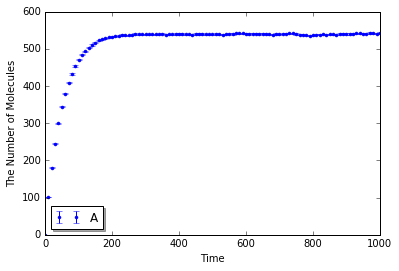

In [22]:
#viz.plot_number_observer(obs4,'r.',obs2,'g.',obs3,'k-',obs5,'y-',obs6,'c-')
viz.plot_number_observer(obs,'r.')

In [4]:
V=L**3
np.array(obs.error()).T[1][-1]/V  

0.02376839077430359

In [5]:
np.array(obs.data()).T[1][-1]/L**3

5.0606000000000018

In [ ]:
5.265